In [ ]:
library(Seurat)
library(SeuratDisk)
library(ggeasy)
library(ggalluvial)
library(patchwork)
library(SingleR)
library(clusterProfiler)
library(enrichplot)
library(dplyr)
source("./utils.R")
nature_cols <- c('#A5D38F','#E45D61','#DA8F6F','#5F9BBE','#684797','#67A59B','#F19294','#4A9D47','#3377A9','#BDA7CB','#F5B375',
                 '#E0C880','#CD9C9B','#D62E2D','#96C3D8','#C0937E','#F47D2F','#8D75AF','#BB7E50','#A65A35','#DD473E')

Loading required package: ggplot2

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: 'MatrixGenerics'


The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats

In [ ]:
data_miracle <- LoadH5Seurat("result/comparison/atlas_disease_cl_step_pbmc/midas_embed/c_1/default/obj_all.h5seurat")
data_miracle_raw <- LoadH5Seurat("result/comparison/atlas_disease_cl_step_pbmc/midas_embed/c_1/default/obj_raw.h5seurat")

Validating h5Seurat file

Initializing adt with data



Adding counts for adt

Adding miscellaneous information for adt

Initializing rna with data

Adding counts for rna

Adding miscellaneous information for rna

Initializing z with data

Adding counts for z

Adding scale.data for z

Adding variable feature information for z

Adding miscellaneous information for z

Adding reduction c

Adding cell embeddings for c

Adding miscellaneous information for c

Adding reduction c.umap

Adding cell embeddings for c.umap

Adding miscellaneous information for c.umap

Adding graph z_nn

Adding graph z_snn

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results

Validating h5Seurat file

Initializing adt with data

Adding counts for adt

Adding miscellaneous information for adt

Initializing rna with data

Adding counts for rna

Adding miscellaneous information for rna

Adding command information

Adding cell-level metadata

Adding miscellaneous information

Adding tool-specific results



In [4]:
data_miracle <- AddMetaData(data_miracle,metadata = data_miracle@meta.data$batch,col.name = "class")
data_miracle@meta.data$class <- ifelse(data_miracle@meta.data$class %in% c("MH9143425","BGCV09_CV0171","AP11","MH9143276","MH9143427","AP6","MH9143325","MH8919327","MH9143277","AP12"),yes = "Covid19",no = "Normal")
data_miracle <- AddMetaData(data_miracle,metadata = "Normal",col.name = "level")
data_miracle@meta.data$level[data_miracle@meta.data$batch %in% c("MH9143425","BGCV09_CV0171")] <- "Asymptomatic"
data_miracle@meta.data$level[data_miracle@meta.data$batch %in% c("AP11","MH9143276")] <- "Mild"
data_miracle@meta.data$level[data_miracle@meta.data$batch %in% c("MH9143427","AP6")] <- "Moderate"
data_miracle@meta.data$level[data_miracle@meta.data$batch %in% c("MH9143325","MH8919327")] <- "Severe"
data_miracle@meta.data$level[data_miracle@meta.data$batch %in% c("MH9143277","AP12")] <- "Critical"
data_miracle@meta.data$level <- factor(data_miracle@meta.data$level,levels = c("Normal","Asymptomatic","Mild","Moderate","Severe","Critical"))

In [5]:
data_miracle@meta.data

,nCount_adt,nFeature_adt,nCount_rna,nFeature_rna,orig.ident,batch,nCount_z,nFeature_z,third_party_l1,third_party_l2,label_transfer,label_transfer_z,z_snn_res.0.35,seurat_clusters,class,level
,<dbl>,<int>,<dbl>,<int>,<fct>,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>,<chr>,<fct>
B0_CACCGGTAGACAAACG-1,4517,253,1194,637,B0,lll_ctrl,0,0,CD8 T,CD8 TEM,CD8+ Memory T cells,CD8+ Memory T cells,3,3,Normal,Normal
B0_CTCATTTAGAACAAGT-1,1926,234,1106,667,B0,lll_ctrl,0,0,CD4 T,CD4 TCM,CD4+ Memory T cells,CD4+ Memory T cells,2,2,Normal,Normal
B0_TAGCATATCGGTTCCT-1,6174,268,2301,1119,B0,lll_ctrl,0,0,CD4 T,gdT,DP T cells,DP T cells,8,8,Normal,Normal
B0_TTGCACACACAGAAAC-1,3066,248,1192,688,B0,lll_ctrl,0,0,CD8 T,CD8 Naive,CD8+ Naive T cells,CD8+ Naive T cells,6,6,Normal,Normal
B0_TCCGCCATCAGCTAAC-1,2229,233,1497,868,B0,lll_ctrl,0,0,CD8 T,CD8 Naive,CD8+ Naive T cells,CD8+ Naive T cells,6,6,Normal,Normal
B0_CTAACCACATCGCTCC-1,2723,242,2335,1200,B0,lll_ctrl,0,0,CD4 T,CD4 Naive,CD4+ Memory T cells,CD4+ Memory T cells,2,2,Normal,Normal
B0_TGAGCACGTTAGAGGG-1,2572,241,678,431,B0,lll_ctrl,0,0,CD4 T,CD4 Naive,CD4+ Naive T cells,CD4+ Naive T cells,0,0,Normal,Normal
B0_TCCACAACAATCCCTT-1,2594,243,1242,717,B0,lll_ctrl,0,0,CD4 T,CD4 Naive,CD4+ Naive T cells,CD4+ Naive T cells,0,0,Normal,Normal
B0_TGTGTGAGTTAATGCG-1,5106,269,900,560,B0,lll_ctrl,0,0,CD8 T,CD8 TEM,CD8+ Memory T cells,CD8+ Memory T cells,3,3,Normal,Normal


In [6]:
data_miracle <- NormalizeData(data_miracle, normalization.method = "CLR", margin = 2, assay = "adt")
data_miracle <- NormalizeData(data_miracle, assay = "rna")

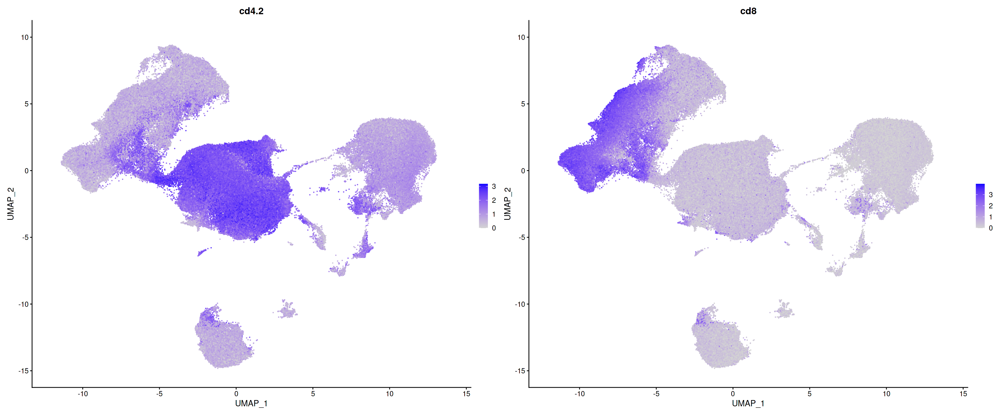

In [9]:
DefaultAssay(data_miracle) <- "adt"
FeaturePlot(data_miracle,features = c("cd4.2","cd8"),dims = 1:2,reduction = "c.umap",raster=FALSE)

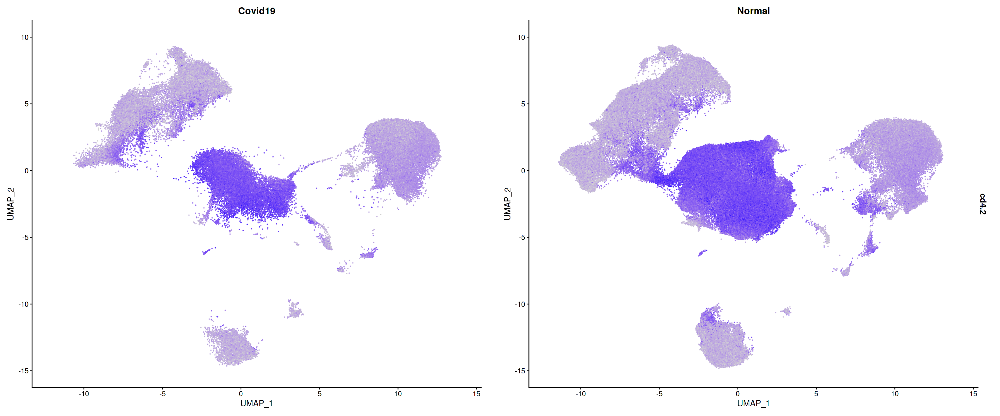

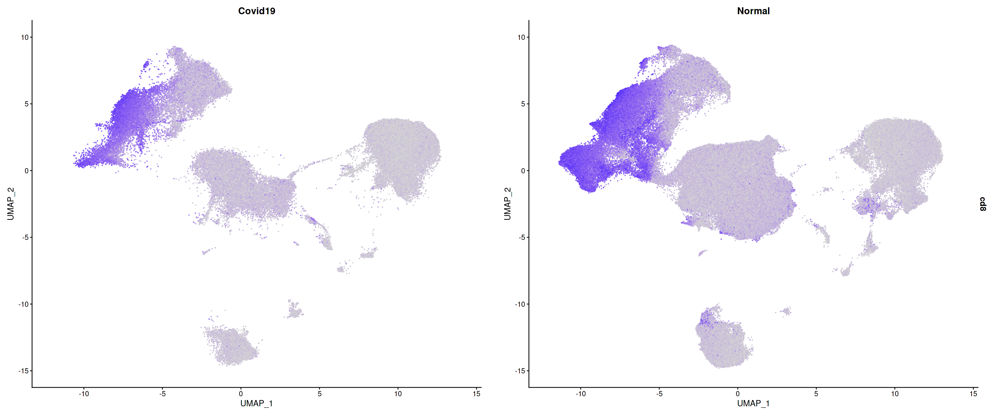

In [8]:
plt_size(w = 24, h = 10)
DefaultAssay(data_miracle) <- "adt"
FeaturePlot(data_miracle,features = "cd4.2",dims = 1:2,reduction = "c.umap",raster=FALSE,slot = "data",split.by = "class")
FeaturePlot(data_miracle,features = "cd8",dims = 1:2,reduction = "c.umap",raster=FALSE,slot = "data",split.by = "class")

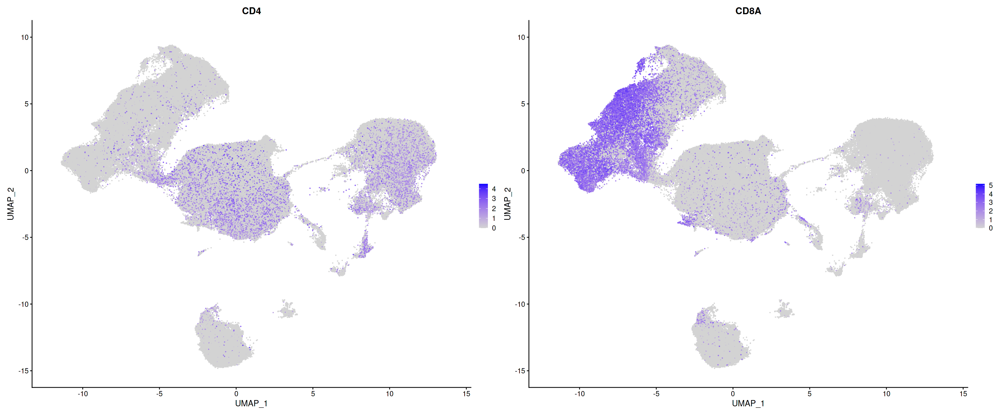

In [10]:
DefaultAssay(data_miracle) <- "rna"
FeaturePlot(data_miracle,features = c("CD4","CD8A"),dims = 1:2,reduction = "c.umap",raster=FALSE)

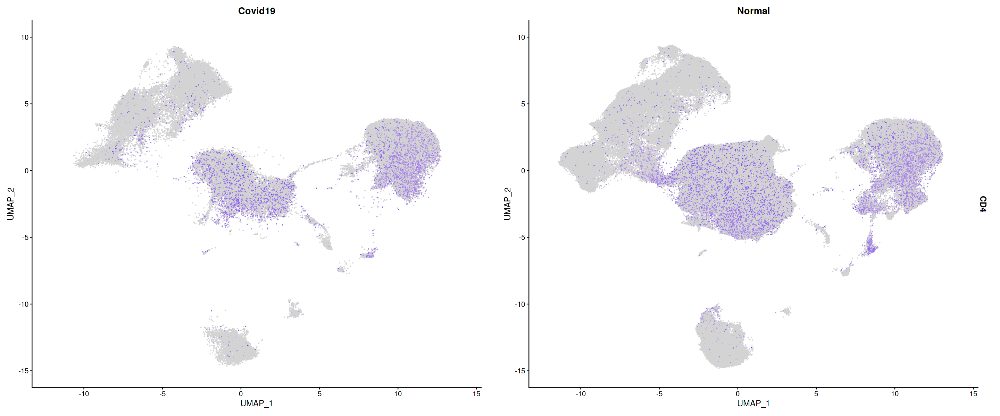

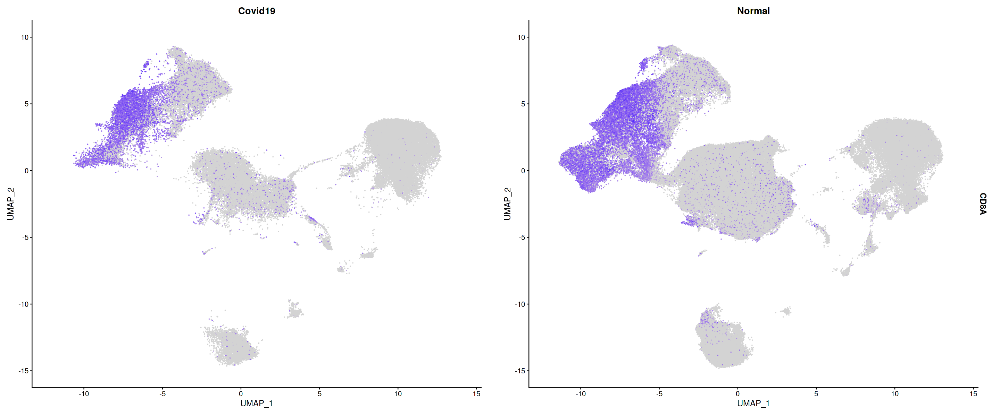

In [11]:
plt_size(w = 24, h = 10)
DefaultAssay(data_miracle) <- "rna"
FeaturePlot(data_miracle,features = "CD4",dims = 1:2,reduction = "c.umap",raster=FALSE,slot = "data",split.by = "class")
FeaturePlot(data_miracle,features = "CD8A",dims = 1:2,reduction = "c.umap",raster=FALSE,slot = "data",split.by = "class")

In [12]:
data_miracle <- FindNeighbors(data_miracle, dims = 1:32,reduction = "c",graph.name =c("all_nn","all_snn"))
data_miracle <- FindClusters(data_miracle, resolution = 1.4,graph.name = "all_snn")

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 350727
Number of edges: 8202962

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8815
Number of communities: 79
Elapsed time: 219 seconds


25 singletons identified. 54 final clusters.

Warning message:
"UNRELIABLE VALUE: One of the 'future.apply' iterations ('future_lapply-1') unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore"."


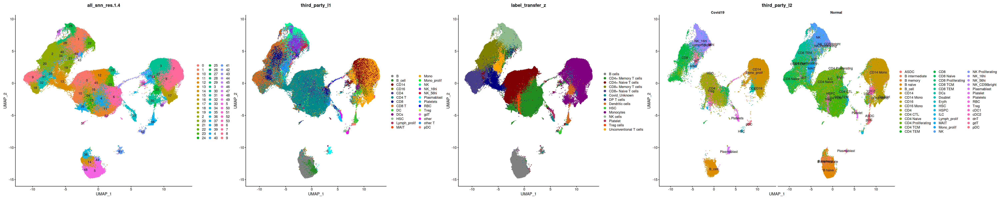

In [13]:
plt_size(w = 50, h = 10)
p1 <- DimPlot(data_miracle,dims = 1:2,reduction = "c.umap",raster=FALSE,group.by = c("all_snn_res.1.4"),label = T)
p2 <- DimPlot(data_miracle,dims = 1:2,reduction = "c.umap",raster=FALSE,group.by = c("third_party_l1","label_transfer_z"),cols = col_32,shuffle = T)
p3 <- DimPlot(data_miracle,dims = 1:2,reduction = "c.umap",raster=FALSE,group.by = c("third_party_l2"),split.by = "class",shuffle = T,label = T)
p1+p2+p3+plot_layout(widths = c(1.5, 3,2))

In [14]:
seurat_cluster_1.2 <- data_miracle@meta.data$`all_snn_res.1.2`
seurat_cluster_celltype <- plyr::mapvalues(seurat_cluster_1.2,from = 0:50,to=c(
    "CD4+ Naive T cells","Monocytes CD14hi","NK CD56low","CD8+ Memory T cells","CD8+ Naive T cells","CD4+ Cytotoxic T cells",
    "CD4+ Memory T cells","B cells","Monocytes CD14hi","Monocytes CD16hi","CD4+ Naive T cells",
    "CD4+ Naive T cells","CD8+ Cytotoxic T cells","Unconventional T cells","DP T cells","CD4+ Memory T cells",
    "B cells","CD4+ Naive T cells","Treg cells","NK CD56hi","Monocytes CD14hi",
    "NK CD56low","Dendritic cells","CD4+ Naive T cells","Monocytes CD14hi","CD8+ Cytotoxic T cells",
    "CD4+ Naive T cells","CD8+ Naive T cells","CD8+ Naive T cells","B cells","pDC",
    "CD4+ Memory T cells","Monocytes CD14hi","Platelets","Plasmablast","CD8+ Cytotoxic T cells",
    "HSC","CD8+ Memory T cells","RBC","B cells","Monocytes CD16hi",
    "CD4+ Naive T cells","NK CD56low","B cells","Unconventional T cells","Monocytes CD14hi",
    "CD4+ Memory T cells","CD4+ Memory T cells","Monocytes CD14hi","Monocytes CD14hi","Monocytes CD14hi"
    ))
    

The following `from` values were not present in `x`: 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50



In [15]:
seurat_cluster_1.4 <- data_miracle@meta.data$`all_snn_res.1.4`
seurat_cluster_celltype <- plyr::mapvalues(seurat_cluster_1.4,from = 0:53,to=c(
    #0:5
    "CD4+ Naive T","NK CD56low","CD8+ Cytotoxic T","CD14+ Mono","CD4+ Memory T","B",
    #6:10
    "CD4+ Cytotoxic T","CD14+ Mono","CD14+ Mono","CD8+ Naive T","CD4+ Naive T",
    #11:15
    "CD4+ Memory T","CD4+ Naive T","DP T","B","Treg",
    #16:20
    "CD4+ Naive T","CD16+ Mono","CD8+ Naive T","MAIT","CD8+ Memory T",
    #21:25
    "gdT","NK CD56hi","CD4+ Naive T","CD4+ Naive T","cDC",
    #26:30
    "NK CD56low","CD14+ Mono","CD8+ Cytotoxic T","CD4+ Naive T","CD14+ Mono",
    #31:35
    "CD8+ Naive T","CD8+ Naive T","Platelets","CD8+ Cytotoxic T","CD8+ Memory T",
    #36:40
    "B","CD14+ Mono","pDC","CD4+ Naive T","CD8+ Cytotoxic T",
    #41:45
    "Plasmablast","HSC","RBC","B","CD4+ Naive T",
    #46:50
    "CD16+ Mono","NK CD56low","B","NK T","CD14+ Mono",
    #51:53
    "CD4+ Naive T","CD4+ Memory T","CD14+ Mono"
    ))

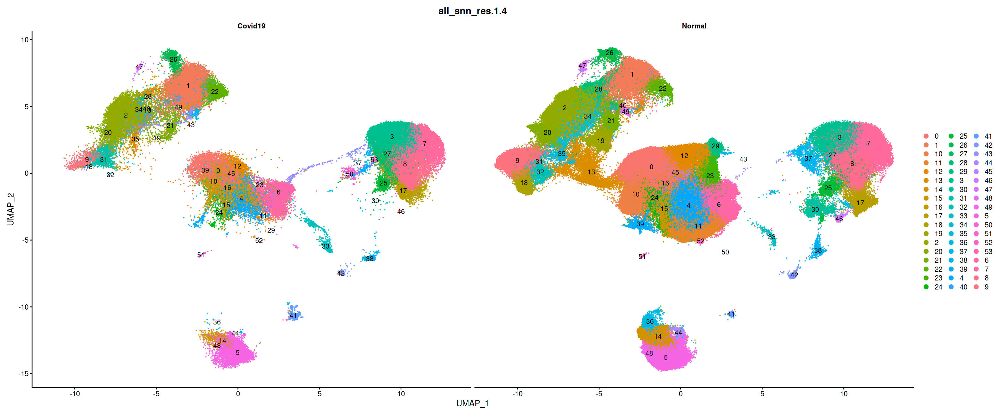

In [16]:
plt_size(w = 24, h = 10)
DimPlot(data_miracle,dims = 1:2,reduction = "c.umap",raster=FALSE,group.by = c("all_snn_res.1.4"),split.by = "class",label = T,shuffle = T)

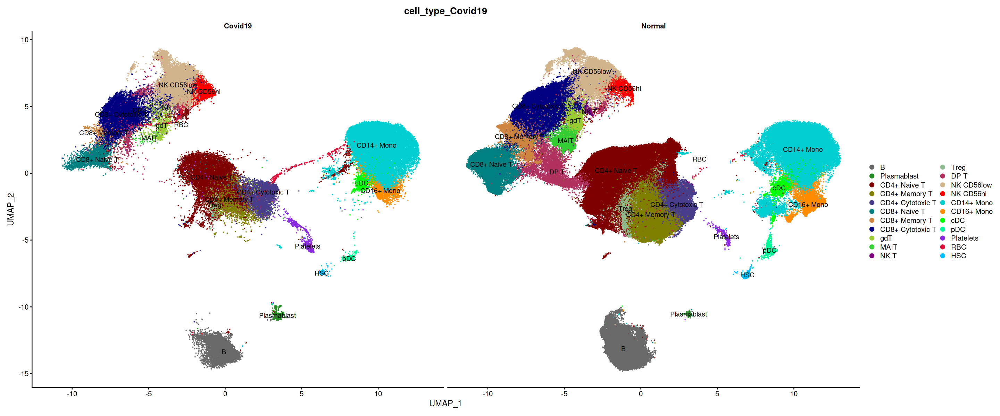

In [18]:
plt_size(w = 24, h = 10)
data_miracle <- AddMetaData(data_miracle,metadata = data_miracle$`all_snn_res.1.4`,col.name = "cell_type_Covid19")
# data_miracle$cell_type_Covid19 <- factor(seurat_cluster_celltype,levels = stringr::str_sort(unique(seurat_cluster_celltype)))
data_miracle$cell_type_Covid19 <- factor(seurat_cluster_celltype,levels = c("B","Plasmablast","CD4+ Naive T","CD4+ Memory T","CD4+ Cytotoxic T","CD8+ Naive T","CD8+ Memory T","CD8+ Cytotoxic T","gdT","MAIT","NK T","Treg","DP T","NK CD56low","NK CD56hi","CD14+ Mono","CD16+ Mono","cDC","pDC","Platelets","RBC","HSC"))
p1 <- DimPlot(data_miracle,dims = 1:2,reduction = "c.umap",raster=FALSE,group.by = c("cell_type_Covid19"),split.by = "class",label = T,shuffle = T,cols=col_34)
p1

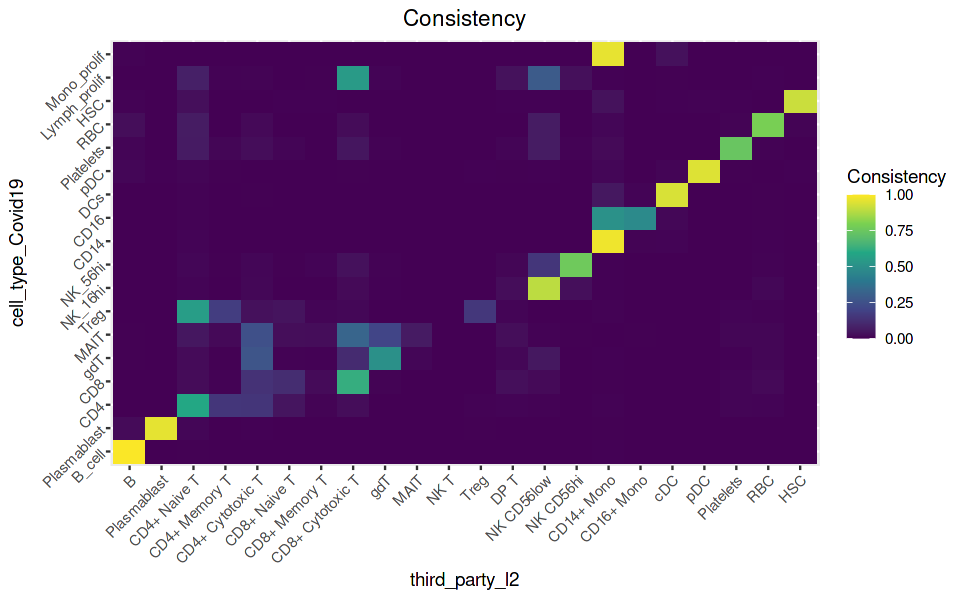

In [21]:
plt_size(8, 5)
gt <- subset(data_miracle,class=="Covid19")@meta.data$third_party_l2
pred <- subset(data_miracle,class=="Covid19")@meta.data$cell_type_Covid19
gt <- factor(as.character(gt),levels = c("B_cell","Plasmablast","CD4","CD8","gdT","MAIT","Treg","NK_16hi","NK_56hi","CD14","CD16","DCs","pDC","Platelets","RBC","HSC","Lymph_prolif","Mono_prolif"))
cm_plot(pred, gt, keep_class=F, legend=T) + ggtitle("Consistency") + theme(plot.title = element_text(hjust = 0.5)) +
     ylab("cell_type_Covid19") + xlab("third_party_l2")

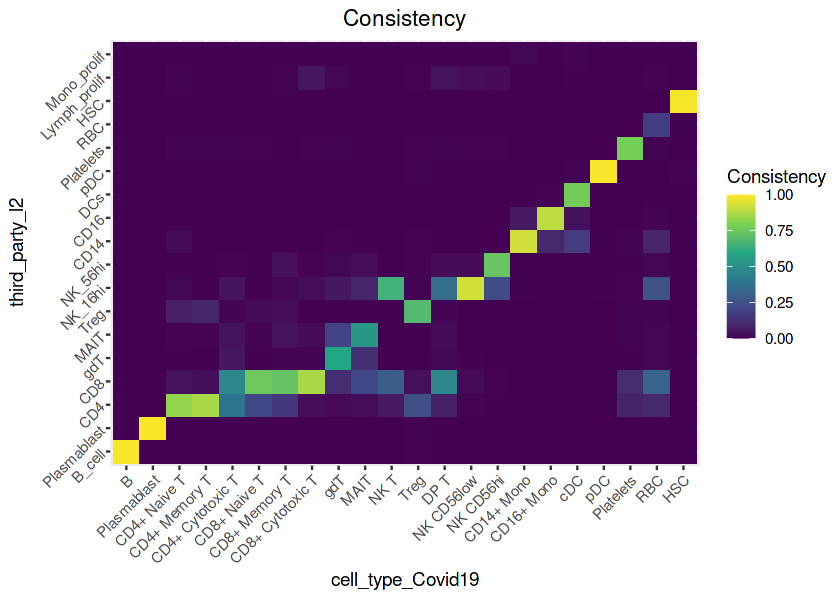

In [23]:
plt_size(7, 5)
p2 <- cm_plot(gt,pred,  keep_class=F, legend=T) + ggtitle("Consistency") + theme(plot.title = element_text(hjust = 0.5)) +
     ylab("cell_type_Covid19") + xlab("third_party_l2")+coord_flip()
p2

In [28]:
celltype_marker <- list(
    B = c('CD79A'),
    Plasmablast = c('MZB1'),
    CD4 = c('CD3D','CD4','GNLY'),
    CD8 = c('CD3D','CD8A','GZMK','GZMB','TRGV9'),
    Treg=c("IKZF2"),
    NK = c('NKG7','NCAM1'),
    Monocyte = c('CD14','FCGR3A','S100A9'),
    cDC=c("HLA-DQA1","HLA-DQB1"),
    pDC = c('IRF7'),
    Platelets=c("PPBP"),
    RBC = c('HBB'),
    HSC=c("CD34")
)

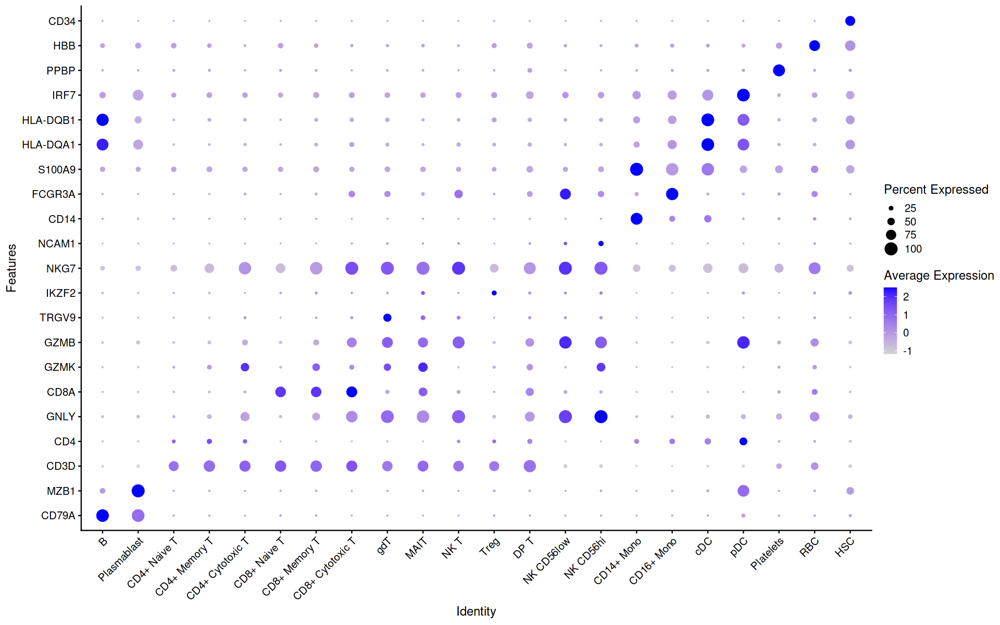

In [30]:
plt_size(w = 16, h = 10)
Idents(data_miracle) <- "cell_type_Covid19"
DefaultAssay(data_miracle) <- "rna"
# DotPlot(data_miracle, features = unique(unlist(celltype_marker[stringr::str_sort(names(celltype_marker))])),scale = T) + RotatedAxis()+ coord_flip()
p3 <- DotPlot(data_miracle, features = unique(unlist(celltype_marker)),scale = T) + RotatedAxis()+ coord_flip()
p3

In [32]:
data_miracle_T <- subset(subset(data_miracle,cell_type_Covid19 %in% c("CD4+ Naive T","CD4+ Memory T","CD4+ Cytotoxic T","CD8+ Naive T","CD8+ Memory T","CD8+ Cytotoxic T")),class=="Covid19")

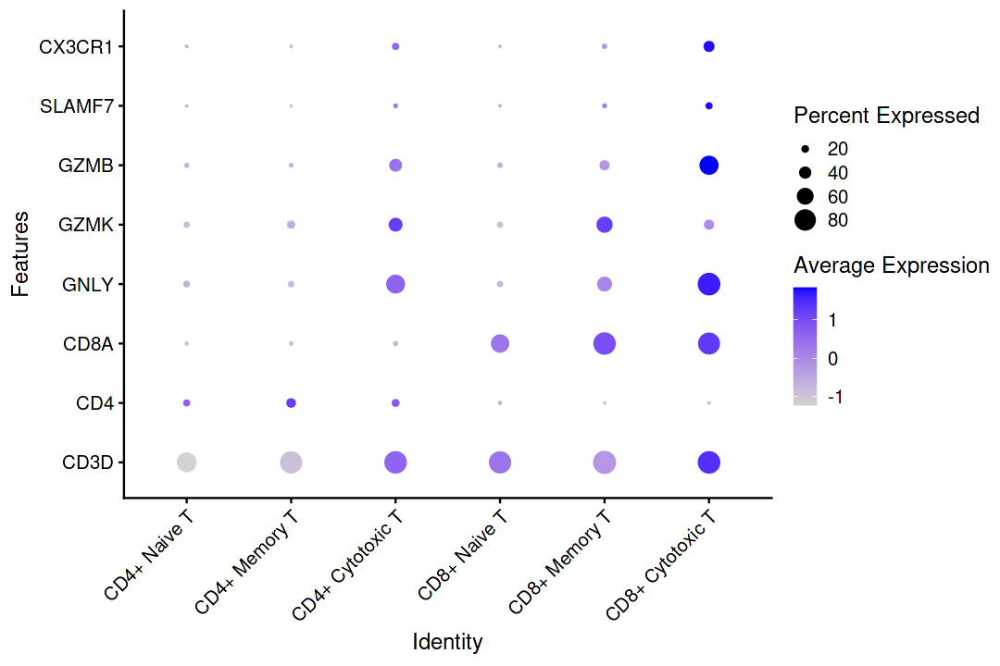

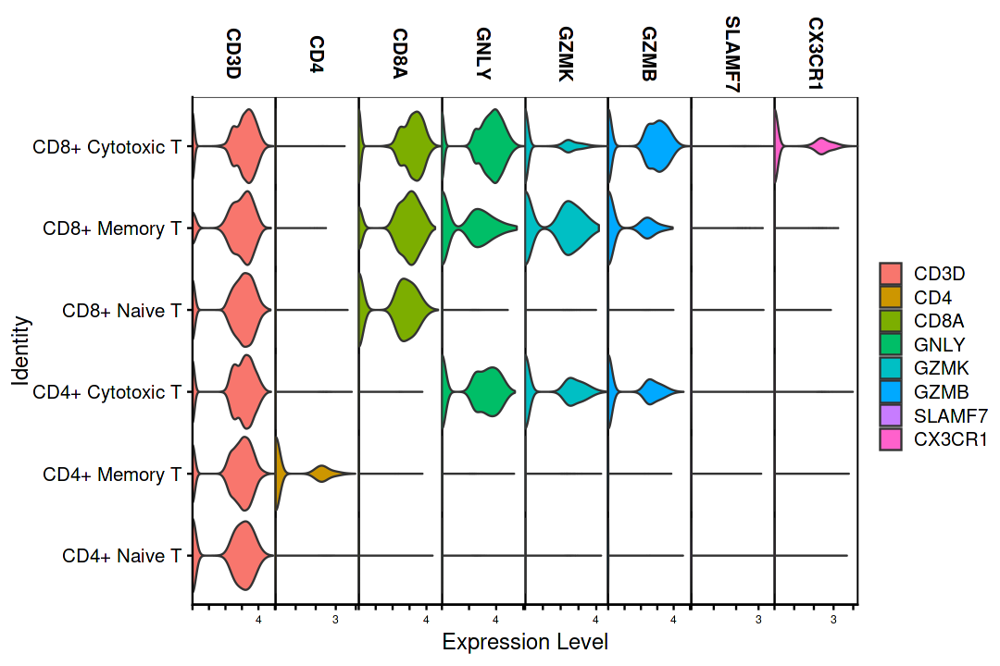

In [35]:
plt_size(w = 9, h = 6)
DefaultAssay(data_miracle_T) <- "rna"
Idents(data_miracle_T) <- "cell_type_Covid19"
rna_marker_list <- c('CD3D','CD4','CD8A','GNLY','GZMK','GZMB','SLAMF7','CX3CR1')
p4 <- DotPlot(data_miracle_T, features = rna_marker_list,scale = T,group.by = "cell_type_Covid19") + RotatedAxis()+ coord_flip()
p4
VlnPlot(data_miracle_T, features = rna_marker_list,stack = T,group.by = "cell_type_Covid19") 

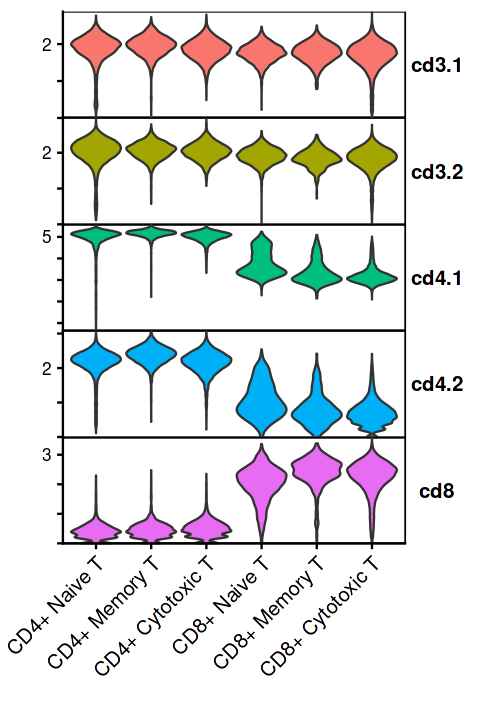

In [37]:
plt_size(w = 4, h = 6)
DefaultAssay(data_miracle_T) <- "adt"
Idents(data_miracle_T) <- "cell_type_Covid19"
rna_marker_list <- c('cd3.1','cd3.2','cd4.1','cd4.2','cd8')
p5 <- VlnPlot(data_miracle_T, features = rna_marker_list,stack = T,group.by = "cell_type_Covid19",flip = T) +NoLegend() + xlab("")+ylab("")+
theme(axis.text.y = element_text(size=10))
p5

Warning message:
"The following features are not present in the object: GPR56, RP11-81H14.2, OGN, METRN, GPR114, BZRAP1, SH3RF2, COLGALT2, SLC2A8, SCD5, AC004840.9, TBKBP1, GFI1, AC092580.4, RP3-467K16.4, PIK3R3, FAM46A, F8A1, RP11-25K19.1, RP4-728D4.2, IL10, CTB-91J4.1, RASSF1, PLA2G16, PPP1R14C, LINC00265, SLC25A20, EPHX4, MIR4435-1HG, RNPEPL1, ZNF365, EPS8L1, RP11-337C18.8, FAM179A, SLC25A29, AXIN1, CERCAM, RNF187, EXTL2, JAKMIP1, GLB1L2, ERMN, CARNS1, RP11-160H22.5, CTB-58E17.1, ZFYVE26, SMKR1, MSC, ZBTB32, KIF15, ATG4D, CCDC102A, ABHD17C, IL8, AGTRAP, CAMK2N1, B3GALT6, MTERFD3, FAM120C, ATMIN, C9orf142, RHEBL1, CAV1, STRN, ITPRIPL1, CPT1A, RP11-66N11.8, DUS1L, NPRL2, CISD3, KIAA1715, LASP1, KLF13, RAP1B, LINC00152, ZNF699, RMND5A, RPTOR, GATS, PTP4A2, IKBKG, FBXO6, PI4K2A, RP11-162A12.2, MAD2L2, SLC35B2, AC093673.5, PPP1R18, CLIC1, TESK1, FHOD1, C5orf56, MSN, STK11IP, DYRK1A, SIRT2, APEX2, FBXL6, SNX11, CCZ1B, H6PD, FBXW5, SLC9A3R1, ALKBH4, TAPBPL, CNNM3, GPAA1, CTDSP1, FAF1, MMAA

Scale for y is already present.
Adding another scale for y, which will replace the existing scale.
Warning message:
"Removed 5648 rows containing non-finite values (`stat_ydensity()`)."


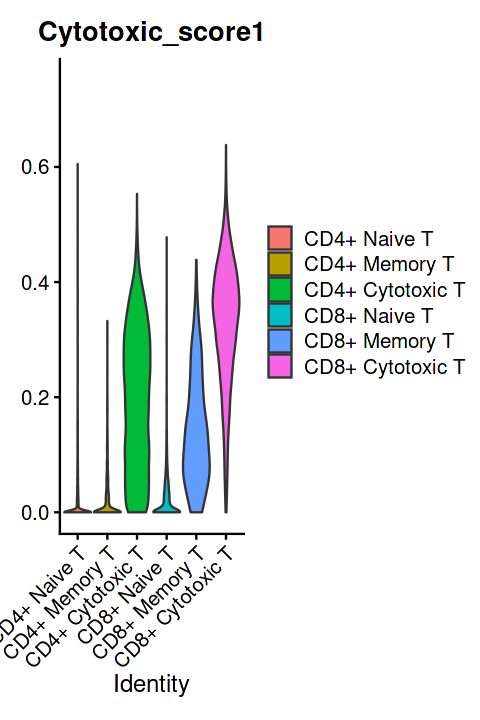

In [ ]:
Cytotoxic_gene_list <- read.table("./cytotoxic_gene_list.txt",header = F,stringsAsFactors = F)
data_miracle_T <- AddModuleScore(data_miracle_T,features = Cytotoxic_gene_list,assay = "rna",name = "Cytotoxic_score")
data_miracle_T$Cytotoxic_score1[data_miracle_T$Cytotoxic_score1<0] <- 0
VlnPlot(data_miracle_T, features = c("Cytotoxic_score1"),group.by = "cell_type_Covid19",pt.size = 0) +ylim(0,0.75)

In [41]:
data_miracle_T_CD4 <- subset(data_miracle_T,cell_type_Covid19 %in% c("CD4+ Naive T","CD4+ Memory T","CD4+ Cytotoxic T"))

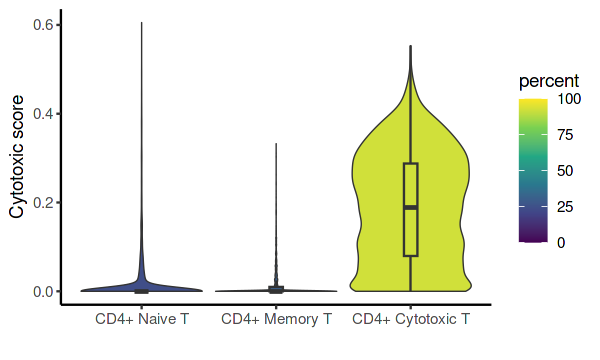

In [45]:
data_Cytotoxic_score <- data_miracle_T_CD4@meta.data[,c("Cytotoxic_score1","cell_type_Covid19")]
data_Cytotoxic_score <- data_Cytotoxic_score %>% group_by(cell_type_Covid19) %>% mutate(percent = sum(Cytotoxic_score1>0)/n()*100) 
plt_size(5, 3)
p6 <- ggplot(data_Cytotoxic_score,aes(x = cell_type_Covid19,y = Cytotoxic_score1,fill=percent))+
geom_violin(scale = "width",linewidth=0.3)+
geom_boxplot(outlier.shape = NA,width = 0.1)+
scale_fill_viridis_c(limits=c(0,100),direction = 1)+
theme_classic()+
xlab("")+ylab("Cytotoxic score")
p6

In [47]:
data_GSEA <- FoldChange(data_miracle_T_CD4,`ident.1` = "CD4+ Cytotoxic T",slot = "data",assay = "rna",group.by = "cell_type_Covid19") %>% arrange(desc(avg_log2FC))
data_GSEA <- data_GSEA$avg_log2FC
names(data_GSEA) <- rownames(data_miracle_T_CD4@assays$rna)
GSEA_result <- GSEA(data_GSEA,TERM2GENE = data.frame(term = "Cytotoxic signature",gene=Cytotoxic_gene_list))

preparing geneSet collections...

GSEA analysis...

leading edge analysis...

done...



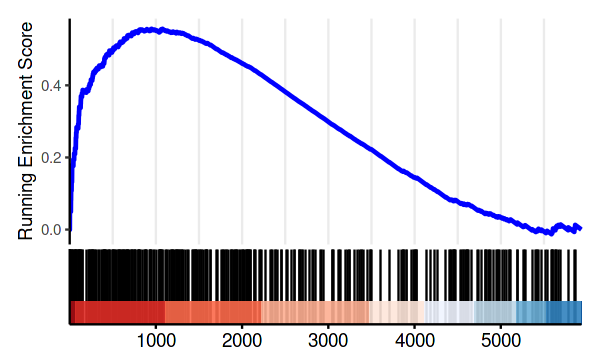

In [49]:
p7 <- enrichplot::gseaplot2(GSEA_result, geneSetID = "Cytotoxic signature",pvalue_table = F,  ES_geom="line", color = "blue",subplots = 1:2)
p7

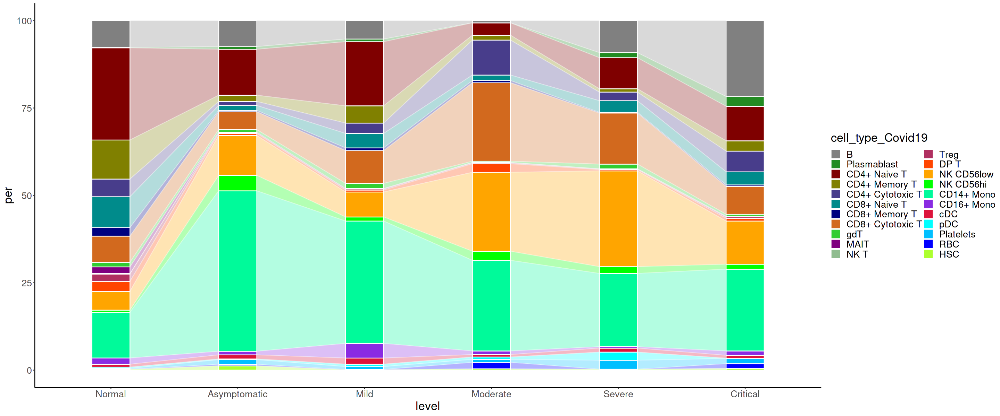

In [52]:
plt_size(w = 24, h = 10)
proportion_data <- data_miracle@meta.data[,c("cell_type_Covid19","level")]
proportion_data <- proportion_data %>% dplyr::count(cell_type_Covid19, level, sort = TRUE) %>% group_by(level) %>% mutate(per =  100 *n/sum(n))
proportion_data$group <- factor(proportion_data$level,levels = c("Asymptomatic","Mild","Moderate","Severe","Critical"))
p8 <- ggplot(data = proportion_data, 
       aes(x = level, y = per,
           stratum = cell_type_Covid19, 
           alluvium = cell_type_Covid19, 
           fill = cell_type_Covid19, 
           colour = id)) + 
  geom_flow(stat = "alluvium", lode.guidance = "frontback",
            color = "white",width = 0.3,curve_type = "linear",alpha=0.3) +
  geom_stratum(color = "white", width = 0.3) +
  scale_fill_manual(values = col_32)+
  theme_classic()+
  theme(text = element_text(size = 20))
p8

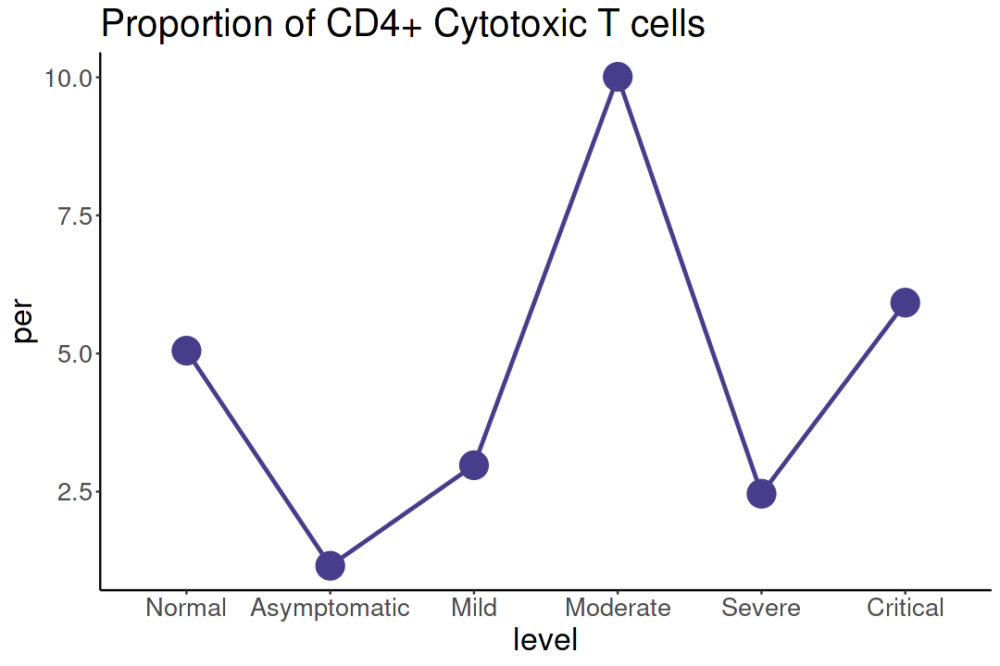

In [57]:
plt_size(w = 9, h = 6)
p9 <- ggplot(data = proportion_data %>% dplyr::filter(cell_type_Covid19 == "CD4+ Cytotoxic T"), 
       aes(x = level, y = per, group=1))+geom_line(colour = I("#483d8b"),linewidth=1)+geom_point(size=8,colour = I("#483d8b"))+
  scale_color_manual(values = col_32)+
  theme_classic()+
  theme(text = element_text(size = 20))+ggtitle("Proportion of CD4+ Cytotoxic T cells")
p9

In [59]:
data_miracle_raw_use <- subset(data_miracle,class == "Covid19")
data_miracle_raw <- RenameCells(data_miracle_raw, new.names = Cells(data_miracle_raw_use))

In [60]:
data_miracle_raw_use[["adt_raw"]] <- data_miracle_raw@assays$adt
data_miracle_raw_use[["rna_raw"]] <- data_miracle_raw@assays$rna

Warning message:
"Cannot add objects with duplicate keys (offending key: adt_), setting key to 'adt_raw_'"


Warning message:
"Cannot add objects with duplicate keys (offending key: rna_), setting key to 'rna_raw_'"


In [61]:
data_miracle_raw_use <- NormalizeData(data_miracle_raw_use, normalization.method = "CLR", margin = 2, assay = "adt_raw")
data_miracle_raw_use <- NormalizeData(data_miracle_raw_use, assay = "rna_raw")

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from adt_raw_ to adtraw_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from rna_raw_ to rnaraw_"


In [62]:
data_miracle_T_raw <- subset(data_miracle_raw_use,cell_type_Covid19 %in% c("CD4+ Naive T","CD4+ Memory T","CD4+ Cytotoxic T","CD8+ Naive T","CD8+ Memory T","CD8+ Cytotoxic T"))

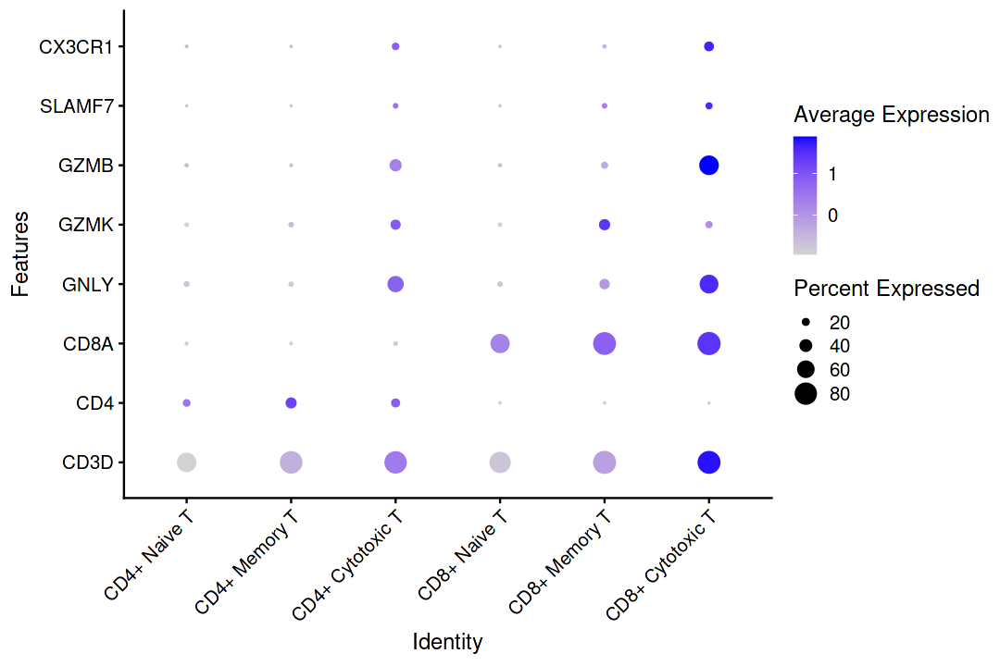

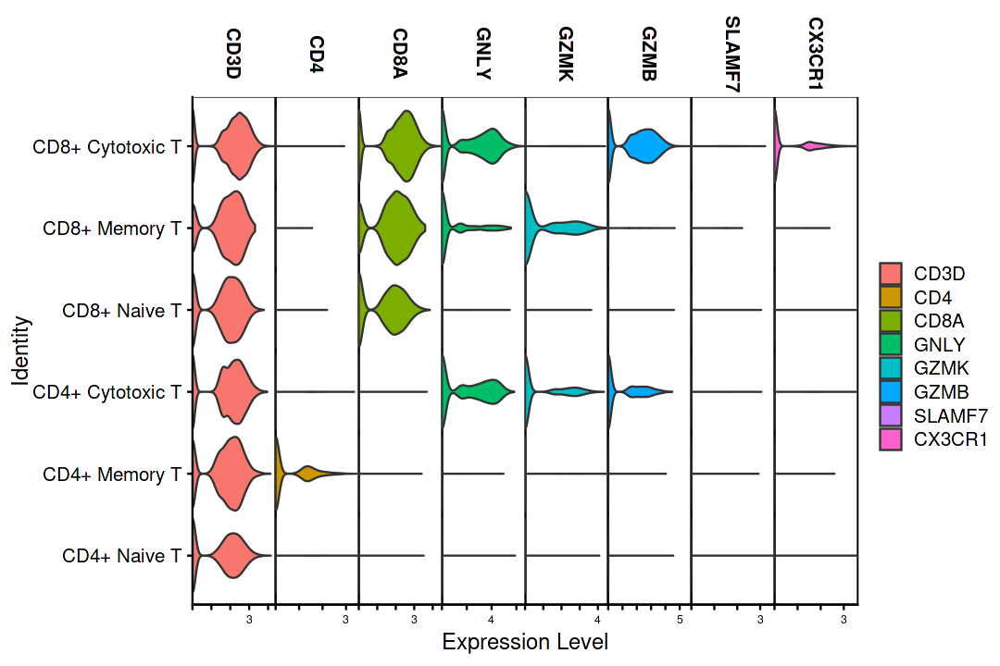

In [64]:
plt_size(w = 9, h = 6)
DefaultAssay(data_miracle_T_raw) <- "rna_raw"
Idents(data_miracle_T_raw) <- "cell_type_Covid19"
rna_marker_list <- c('CD3D','CD4','CD8A','GNLY','GZMK','GZMB','SLAMF7','CX3CR1')
p10 <- DotPlot(data_miracle_T_raw, features = rna_marker_list,scale = T,group.by = "cell_type_Covid19") + RotatedAxis()+ coord_flip()
p10
VlnPlot(data_miracle_T_raw, features = rna_marker_list,stack = T,group.by = "cell_type_Covid19") 

Warning message:
"Could not find cd3.2 in the default search locations, found in adt assay instead"
Warning message:
"Could not find cd4.1 in the default search locations, found in adt assay instead"


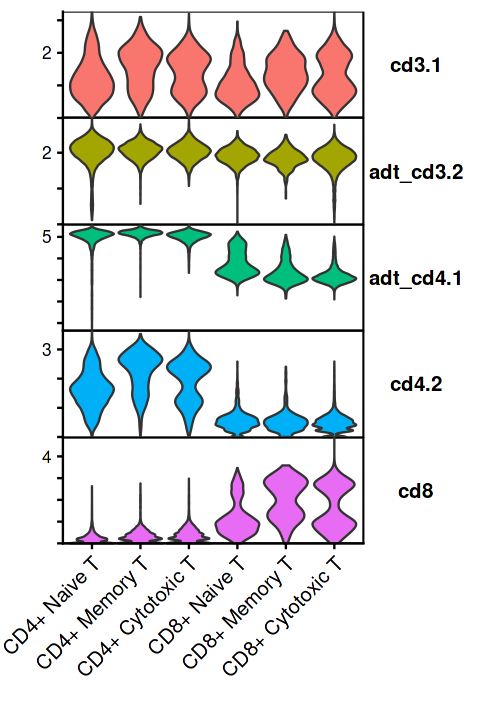

In [67]:
plt_size(w = 4, h = 6)
DefaultAssay(data_miracle_T_raw) <- "adt_raw"
Idents(data_miracle_T_raw) <- "cell_type_Covid19"
rna_marker_list <- c('cd3.1','cd3.2','cd4.1','cd4.2','cd8')
p11 <- VlnPlot(data_miracle_T_raw, features = rna_marker_list,stack = T,group.by = "cell_type_Covid19",flip = T) +NoLegend() + xlab("")+ylab("")+
theme(axis.text.y = element_text(size=10))
p11

In [ ]:
Cytotoxic_gene_list <- read.table("./cytotoxic_gene_list.txt",header = F,stringsAsFactors = F)
data_miracle_T_raw <- AddModuleScore(data_miracle_T_raw,features = Cytotoxic_gene_list,assay = "rna_raw",name = "Cytotoxic_score")
data_miracle_T_raw$Cytotoxic_score1[data_miracle_T_raw$Cytotoxic_score1<0] <- 0

Warning message:
"The following features are not present in the object: GPR56, RP11-81H14.2, GPR114, BZRAP1, AC004840.9, AC092580.4, RP3-467K16.4, FAM46A, RP11-25K19.1, RP4-728D4.2, CTB-91J4.1, PLA2G16, MIR4435-1HG, RP11-337C18.8, FAM179A, RP11-160H22.5, CTB-58E17.1, IL8, MTERFD3, C9orf142, RP11-66N11.8, KIAA1715, LINC00152, GATS, RP11-162A12.2, AC093673.5, C5orf56, GLTSCR1L, C20orf24, not searching for symbol synonyms"


In [70]:
data_miracle_T_CD4_raw <- subset(data_miracle_T_raw,cell_type_Covid19 %in% c("CD4+ Naive T","CD4+ Memory T","CD4+ Cytotoxic T"))

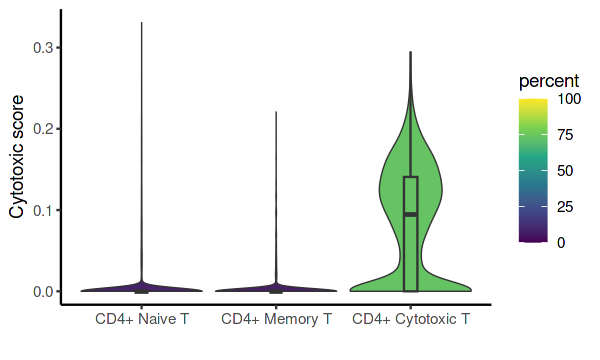

In [72]:
data_Cytotoxic_score <- data_miracle_T_CD4_raw@meta.data[,c("Cytotoxic_score1","cell_type_Covid19")]
data_Cytotoxic_score <- data_Cytotoxic_score %>% group_by(cell_type_Covid19) %>% mutate(percent = sum(Cytotoxic_score1>0)/n()*100) 
plt_size(5, 3)
p12 <- ggplot(data_Cytotoxic_score,aes(x = cell_type_Covid19,y = Cytotoxic_score1,fill=percent))+
geom_violin(scale = "width",linewidth=0.3)+
geom_boxplot(outlier.shape = NA,width = 0.1)+
scale_fill_viridis_c(limits=c(0,100),direction = 1)+
theme_classic()+
xlab("")+ylab("Cytotoxic score")
p12

In [74]:
data_GSEA <- FoldChange(data_miracle_T_CD4_raw,`ident.1` = "CD4+ Cytotoxic T",slot = "data",assay = "rna_raw",group.by = "cell_type_Covid19") %>% arrange(desc(avg_log2FC))
data_GSEA <- data_GSEA$avg_log2FC
names(data_GSEA) <- rownames(data_miracle_T_CD4_raw@assays$rna_raw)
GSEA_result <- GSEA(data_GSEA,TERM2GENE = data.frame(term = "Cytotoxic signature",gene=Cytotoxic_gene_list))

preparing geneSet collections...

GSEA analysis...

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
"There are ties in the preranked stats (0.57% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results."
leading edge analysis...

done...



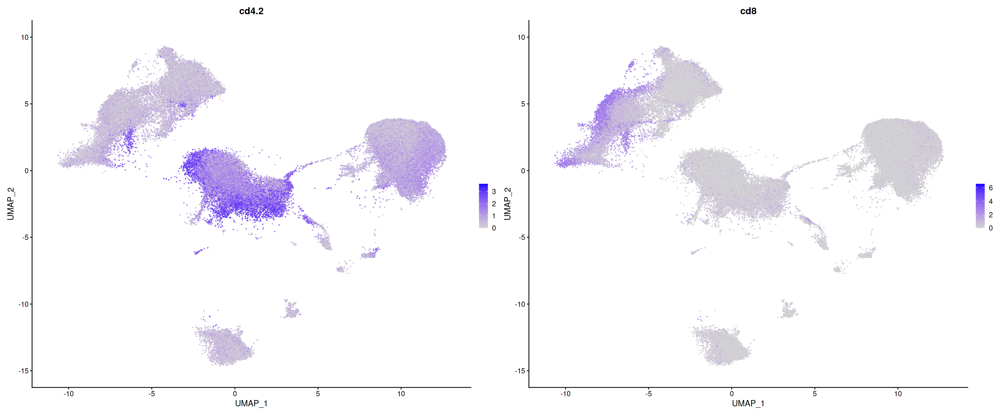

In [79]:
plt_size(w = 24, h = 10)
DefaultAssay(data_miracle_raw_use) <- "adt_raw"
FeaturePlot(data_miracle_raw_use,features = c("cd4.2","cd8"),dims = 1:2,reduction = "c.umap",raster=FALSE,slot = "data")

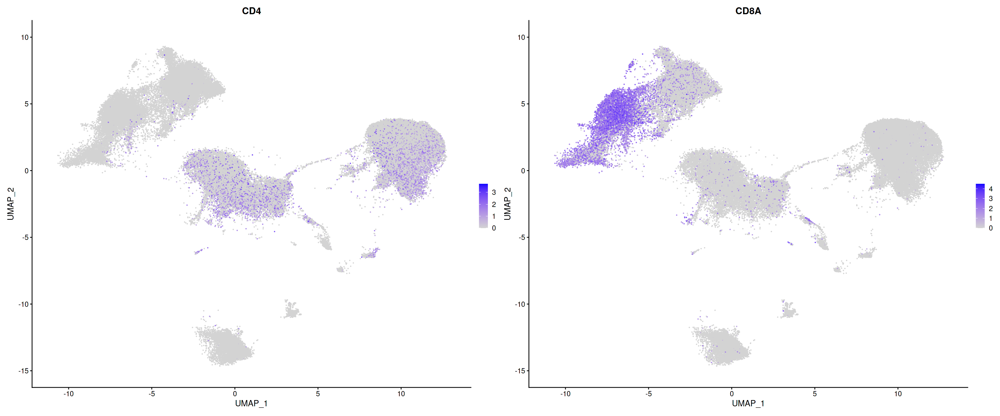

In [80]:
plt_size(w = 24, h = 10)
DefaultAssay(data_miracle_raw_use) <- "rna_raw"
FeaturePlot(data_miracle_raw_use,features = c("CD4","CD8A"),dims = 1:2,reduction = "c.umap",raster=FALSE)